# Overview
This notebook uses YOLO to detect specific classes from images in the COCO dataset. It initially does some validation on the data, then identifies specific classes to look for and uses that to filter out a few images instead of using the entire dataset. These images are then processed with YOLO and the results are visually annotated. Additional documentation and comments detailing the behavior can be found throughout the notebook.

# Environment Setup

Run this once to install the necessary libraries

In [1]:
#use_conda = False
#if use_conda:
#    !conda create --name yolo_demo python=3.10
#    !conda activate yolo_demo
#!pip install ultralytics pycocotools matplotlib torchvision supervision

Import all the libraries we'll need throughout the notebook

In [2]:
from ultralytics import YOLO
from pycocotools.coco import COCO
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
from enum import Enum
import torchvision, os, math, cv2
import supervision as sv

# Dataset Analysis

initialize a YOLO v11 model and see what classes it supports

In [3]:
def get_yolo_model(yolo_model='yolo11l.pt'):
    """ Creates a YOLO model

    Args:
        yolo_model (str, optional): The YOLO model to initialize. Defaults to 'yolo11l.pt'.

    Returns:
        object: The YOLO model.
    """
    model = YOLO(yolo_model)        
    return model

yolo_model = get_yolo_model()
print(yolo_model.names)

100%|██████████| 49.0M/49.0M [00:01<00:00, 35.0MB/s]


{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

Since the validation portion of the COCO dataset is relatively small download it from https://cocodataset.org/#download and extract it to the current directory. Then specify the location of the root and annotations. I did have problems doing this with Chrome due to some http/https incompatibility but was able to do it with Edge after clicking a couple buttons indicating I accept the risks.

In [4]:
coco_root    = './datasets/coco/val2017'
coco_annFile = './datasets/coco/annotations/instances_val2017.json'

Read the COCO annotations and see which categories/classes are supported.

In [5]:
def get_coco_categories(annFile=coco_annFile):
    """ Display the classes supported by the COCO dataset

    Args:
        annFile (str, optional): The path path to the COCO annotations. Defaults to coco_annFile as specified above.
        display_classes (bool, optional): Whether or not to display the classes in the COCO dataset. Defaults to False.

    Returns:
        list: The categories in the COCO dataset
    """

    # Read the annotations
    coco = COCO(annFile)

    # Get all category IDs
    ids = coco.getCatIds()

    # Get category names for each of the category IDs
    categories = coco.loadCats(ids)
        
    return categories

coco_categories = get_coco_categories()
print([{category['id']: category['name']} for category in coco_categories])

loading annotations into memory...
Done (t=0.43s)
creating index...
index created!
[{1: 'person'}, {2: 'bicycle'}, {3: 'car'}, {4: 'motorcycle'}, {5: 'airplane'}, {6: 'bus'}, {7: 'train'}, {8: 'truck'}, {9: 'boat'}, {10: 'traffic light'}, {11: 'fire hydrant'}, {13: 'stop sign'}, {14: 'parking meter'}, {15: 'bench'}, {16: 'bird'}, {17: 'cat'}, {18: 'dog'}, {19: 'horse'}, {20: 'sheep'}, {21: 'cow'}, {22: 'elephant'}, {23: 'bear'}, {24: 'zebra'}, {25: 'giraffe'}, {27: 'backpack'}, {28: 'umbrella'}, {31: 'handbag'}, {32: 'tie'}, {33: 'suitcase'}, {34: 'frisbee'}, {35: 'skis'}, {36: 'snowboard'}, {37: 'sports ball'}, {38: 'kite'}, {39: 'baseball bat'}, {40: 'baseball glove'}, {41: 'skateboard'}, {42: 'surfboard'}, {43: 'tennis racket'}, {44: 'bottle'}, {46: 'wine glass'}, {47: 'cup'}, {48: 'fork'}, {49: 'knife'}, {50: 'spoon'}, {51: 'bowl'}, {52: 'banana'}, {53: 'apple'}, {54: 'sandwich'}, {55: 'orange'}, {56: 'broccoli'}, {57: 'carrot'}, {58: 'hot dog'}, {59: 'pizza'}, {60: 'donut'}, {61: 

The supported classes look to be similar between YOLO and COCO except for the zero and one based indexing. Also COCO skips some numbers, notice a class isn't defined for ID 12. Let's see if all the class names are the same.

In [6]:
yolo_classes = list(yolo_model.names.values())
coco_classes = [category['name'] for category in coco_categories]
print(yolo_classes)
print(coco_classes)

if yolo_classes == coco_classes:
    print("Classes are all the same")
else:
    print("Classes are different")

['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'par

They support the same classes, let's double verify by looking at the ids for each and the length of the supported class lists.

In [7]:
yolo_ids = list(yolo_model.names.keys())
print(yolo_ids)

coco_ids = [category['id'] for category in coco_categories]
print(coco_ids)

print(len(yolo_ids))
print(len(coco_ids))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90]
80
80


They have the same length and support the same classes but in many cases have different indices. Using the data printed out above let's create a dictionary with the indices we're interested in for both COCO and YOLO to make it easy to keep track of things. In this case we'll be looking for some of the animals.

In [8]:
coco_classes_to_look_for = {'Elephant': 22,
                            'Bear':     23,
                            'Zebra':    24,
                            'Giraffe':  25
                           }

yolo_classes_to_look_for = {'Elephant': 20,
                            'Bear':     21,
                            'Zebra':    22,
                            'Giraffe':  23
                           }

Iterate over the COCO dataset to find a few images to use.

In [9]:
def get_image_paths_and_detected_classes(classes_to_look_for, num_images_needed=20):
    """ Determines the paths and classes detected

    Args:
        classes_to_look_for (list): A list of the COCO class ids to look for.
        num_images_needed (int, optional): The number of images to return. Defaults to 20.

    Returns:
        image_paths : A list of paths for images that have at least one instance of the classes of interest.
        image_classes : A list of all the class ids in the image.
    """

    #Initialize the COCO dataset
    coco_dataset = torchvision.datasets.CocoDetection(root=coco_root, annFile=coco_annFile)

    # Storage for the paths and detections
    image_paths = []
    image_classes = []

    # Iterate over dataset
    for i, (_, target) in enumerate(coco_dataset):
        # Get the ground truth classes for this image
        coco_ground_truth_classes = set([detection['category_id'] for detection in target])

        # See if this image has one of the classes we're interested in
        if coco_ground_truth_classes.intersection(set(classes_to_look_for.values())):
            # Store image path
            image_id = coco_dataset.coco.loadImgs(coco_dataset.ids[i])[0]['file_name']
            image_path = os.path.join(coco_root, image_id)
            image_paths.append(image_path)

            # Store image classes
            image_classes.append(coco_ground_truth_classes)
            
            # Exit when we have enough images
            if (len(image_paths) == num_images_needed):
                break

    return image_paths, image_classes

image_paths, image_classes = get_image_paths_and_detected_classes(coco_classes_to_look_for)
print(image_paths)
print(image_classes)

loading annotations into memory...
Done (t=0.36s)
creating index...
index created!
['./datasets/coco/val2017/000000000285.jpg', './datasets/coco/val2017/000000001818.jpg', './datasets/coco/val2017/000000006894.jpg', './datasets/coco/val2017/000000007108.jpg', './datasets/coco/val2017/000000011760.jpg', './datasets/coco/val2017/000000016010.jpg', './datasets/coco/val2017/000000017031.jpg', './datasets/coco/val2017/000000017115.jpg', './datasets/coco/val2017/000000020059.jpg', './datasets/coco/val2017/000000020247.jpg', './datasets/coco/val2017/000000021903.jpg', './datasets/coco/val2017/000000022969.jpg', './datasets/coco/val2017/000000024919.jpg', './datasets/coco/val2017/000000025096.jpg', './datasets/coco/val2017/000000025139.jpg', './datasets/coco/val2017/000000028449.jpg', './datasets/coco/val2017/000000031269.jpg', './datasets/coco/val2017/000000033707.jpg', './datasets/coco/val2017/000000038825.jpg', './datasets/coco/val2017/000000042296.jpg']
[{23}, {24}, {1, 22}, {22}, {24}, {2

Let's take a look at the images and make sure we got what we expected

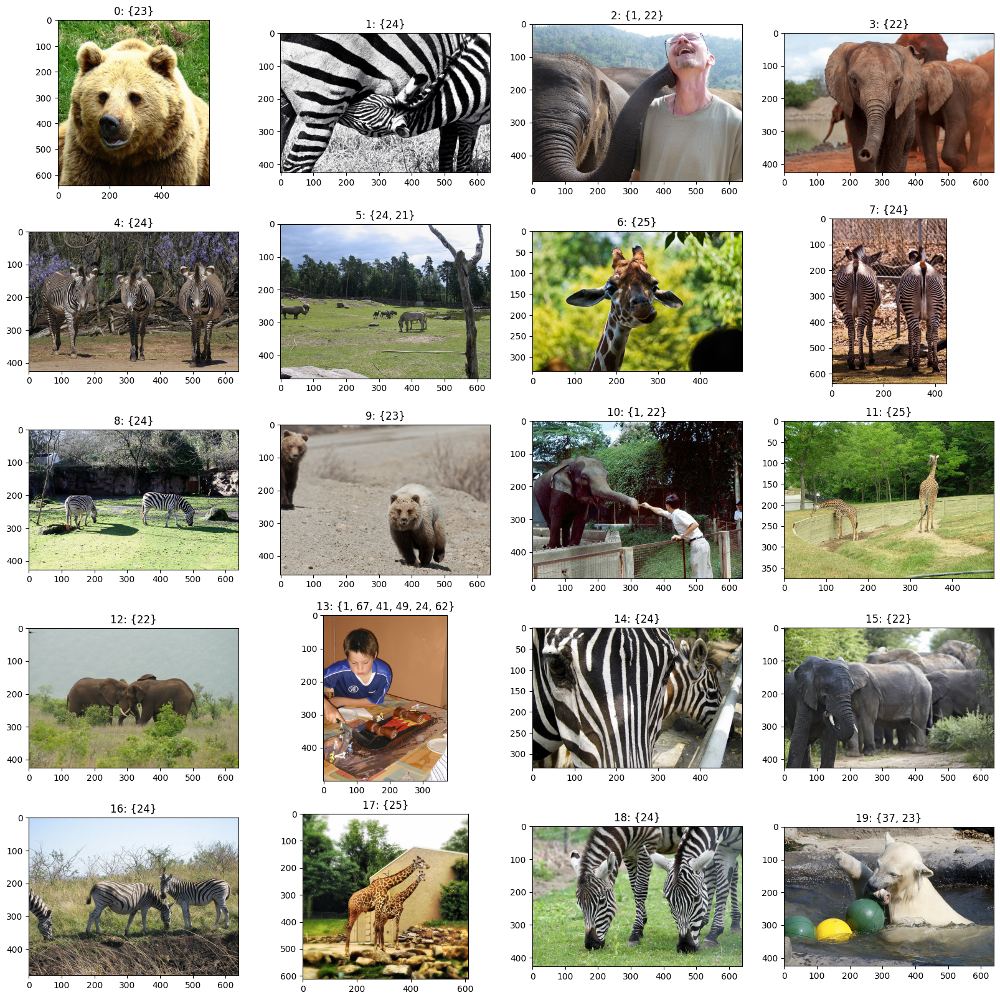

In [10]:
def show_sample_images(paths, classes):
    """ Displays images with their index and detected classes as the title

    Args:
        paths (list): a list of image paths
        classes (list): a list of detected classes for each image
    """

    # Show however images we have in four columns
    plt.figure(figsize=(20,20)) 
    num_images  = len(paths)
    num_columns = 4

    for i in range(num_images):
        plt.subplot(math.ceil(num_images/num_columns), num_columns, i+1)    
        plt.title(f"{str(i)}: {classes[i]}")
        plt.imshow(mpimg.imread(paths[i]))

    plt.show()

show_sample_images(image_paths, image_classes)

Mostly they look right but notice how image 13 doesn't fit in. That will come up again later.

# Evaluation

In [11]:
class Size(Enum):
    SMALL  = 'Small'
    MEDIUM = 'Medium'
    LARGE  = 'Large'

def get_size_category(img_height, img_width, detection_height, detection_width):
    """Determines size category based on the ratio of the detection size and image size

    Args:
        img_height (float): the height of the image
        img_width (float): the width of the image
        detection_height (float): the height of the detection
        detection_width (float): the width of the detection

    Returns:
        string: 'Small' if ratio < .1, 'Large' if ratio > .3, 'Medium' otherwise
    """

    image_size = img_height * img_width
    detection_size = detection_height * detection_width
    ratio = detection_size/image_size

    if ratio < .1:
        return Size.SMALL.value
    if ratio > .3:
        return Size.LARGE.value
    return Size.MEDIUM.value

In [12]:
def get_annotated_image_and_metrics(image_path, yolo_class_list=[], min_confidence=0.5):
    """ Annotates the image with randomly colored bounding boxes for detections, the class name and size category

    Args:
        image_path (string): The path to the image to annotate.
        yolo_class_list (list): List of YOLO class IDs to annotate. Defaults to [] in which case all classes are displayed.
        min_confidence (float): The minimum confidence required to display the detection. Defaults to 0.5.

    Returns:
        img: The annotated images
        detections (object): The detection data
    """

    sizes = []

    # Read image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if len(yolo_class_list) > 0:
        result = yolo_model.predict(img, classes=yolo_class_list)
    else:
        result = yolo_model.predict(img)

    # Filter out low confidence detections
    detections = sv.Detections.from_ultralytics(result[0])
    detections = detections[detections.confidence > min_confidence]

    for box in detections.xyxy:

        # Determine the upper left and lower right coordinates
        x1 = int(box[0])
        y1 = int(box[1])
        x2 = int(box[2])
        y2 = int(box[3])

        # Determine and store size category
        size_category = get_size_category(img.shape[0], img.shape[1], x2-x1, y2-y1)
        sizes.append(size_category)

    # Store sizes
    detections.sizes = sizes

    # Create labels
    labels = [
        f"{yolo_model.model.names[class_id]}: {confidence:0.2f} - {size}"
        for (class_id, confidence, size) 
        in zip(detections.class_id, detections.confidence, sizes)
    ]

    # Create annotators
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator(text_position=sv.Position.TOP_LEFT)

    # Annotate
    annotated_image = box_annotator.annotate(scene=img, detections=detections)
    annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

    return annotated_image, detections

Let's send the images through YOLO and see what is says. Notice how the 14th image (image 13) with the kid from above didn't have any detections from our YOLO classes of interest but in the lower right hand corner there is a white object with black stripes, similar to a zebra. I suspect this caused a bad label in COCO, however if you change the 'show_all_classes' switch in the 'show_image' method to True you can see that it gets detected as a person. We're probably seeing a portion of someone's shirt there.


0: 640x608 1 bear, 48.3ms
Speed: 5.7ms preprocess, 48.3ms inference, 303.3ms postprocess per image at shape (1, 3, 640, 608)


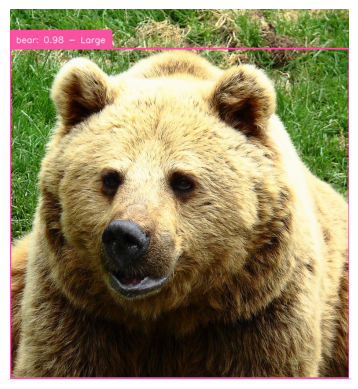


0: 448x640 3 zebras, 57.9ms
Speed: 2.7ms preprocess, 57.9ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


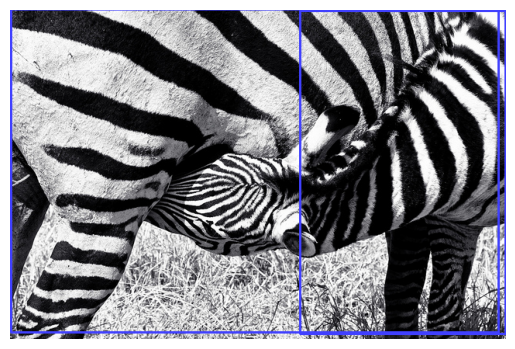


0: 480x640 2 elephants, 48.8ms
Speed: 2.3ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


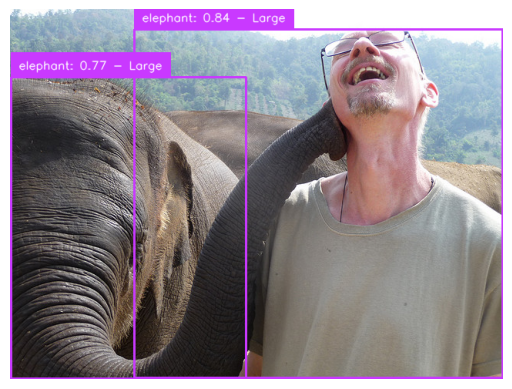


0: 448x640 6 elephants, 29.5ms
Speed: 2.6ms preprocess, 29.5ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


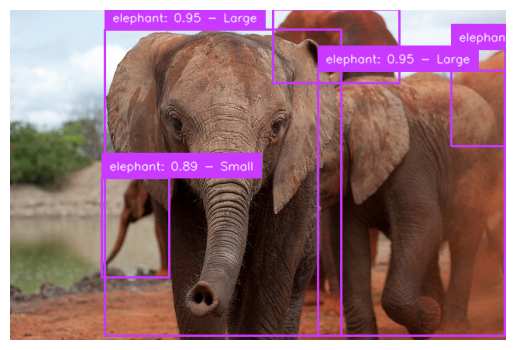


0: 448x640 3 zebras, 15.6ms
Speed: 1.2ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


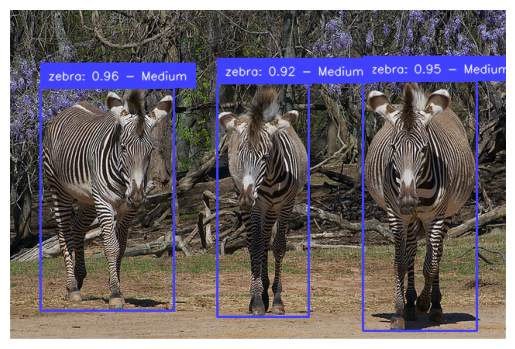


0: 480x640 3 zebras, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


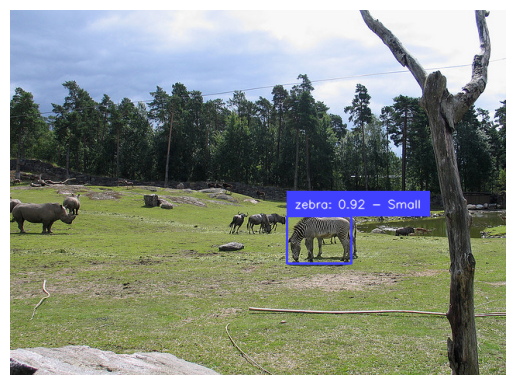


0: 448x640 1 giraffe, 23.7ms
Speed: 7.3ms preprocess, 23.7ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


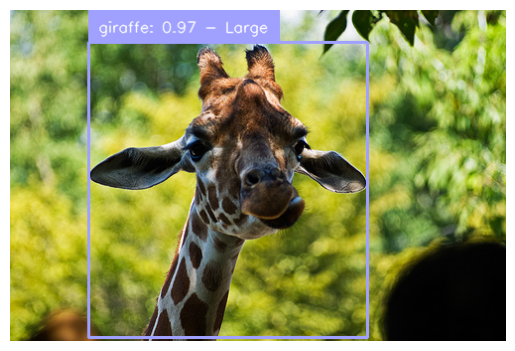


0: 640x448 2 zebras, 33.3ms
Speed: 1.0ms preprocess, 33.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)


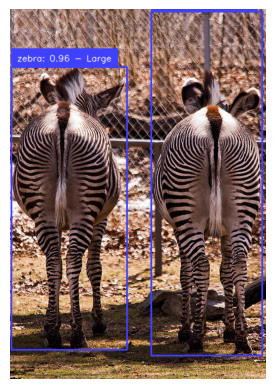


0: 448x640 2 zebras, 24.9ms
Speed: 2.9ms preprocess, 24.9ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


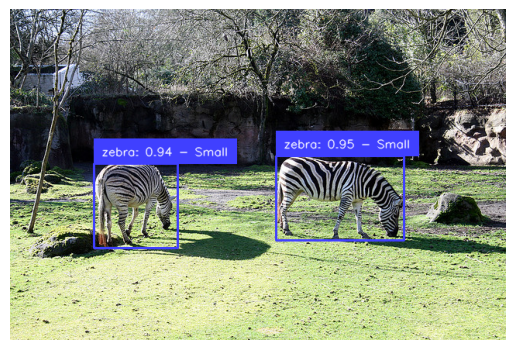


0: 480x640 2 bears, 16.8ms
Speed: 1.3ms preprocess, 16.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


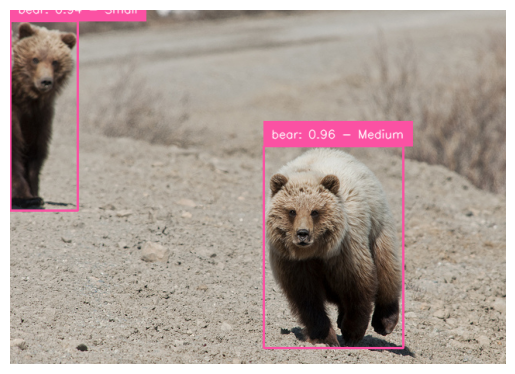


0: 480x640 1 elephant, 16.2ms
Speed: 1.3ms preprocess, 16.2ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


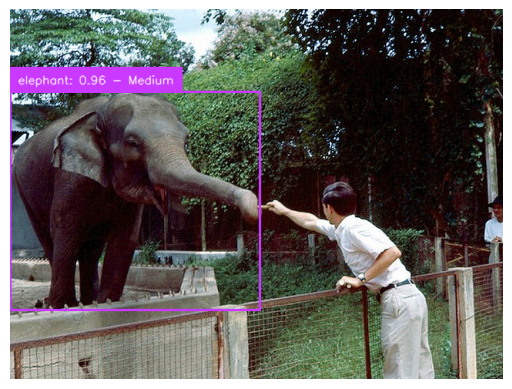


0: 480x640 2 giraffes, 16.0ms
Speed: 1.7ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


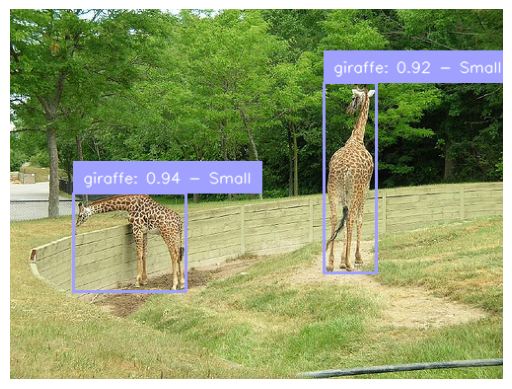


0: 448x640 2 elephants, 16.1ms
Speed: 1.1ms preprocess, 16.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


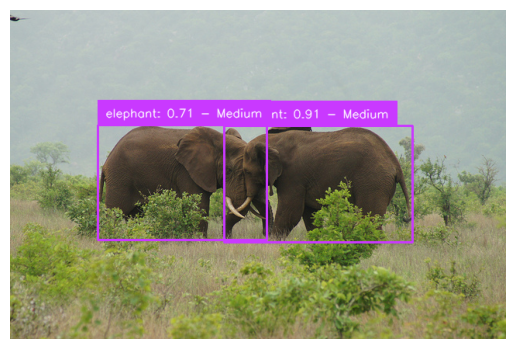


0: 640x480 (no detections), 34.3ms
Speed: 1.6ms preprocess, 34.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


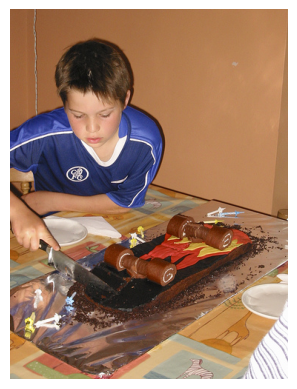


0: 448x640 2 zebras, 16.1ms
Speed: 1.5ms preprocess, 16.1ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


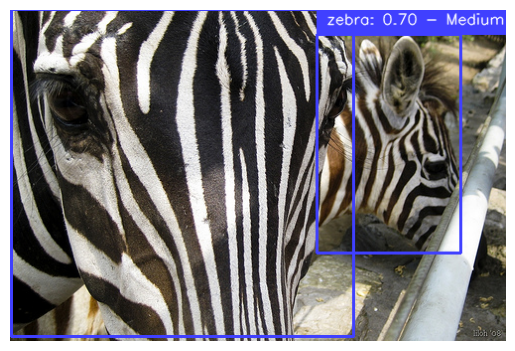


0: 448x640 5 elephants, 15.6ms
Speed: 1.1ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


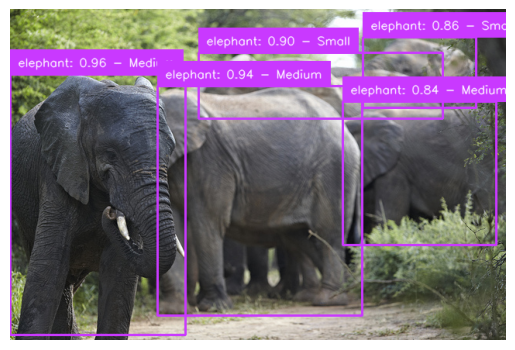


0: 480x640 3 zebras, 16.7ms
Speed: 1.1ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


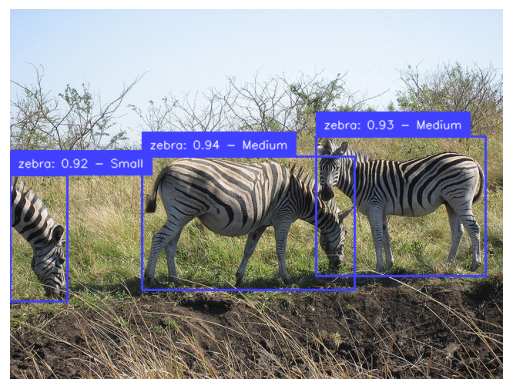


0: 640x640 2 giraffes, 21.8ms
Speed: 6.4ms preprocess, 21.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


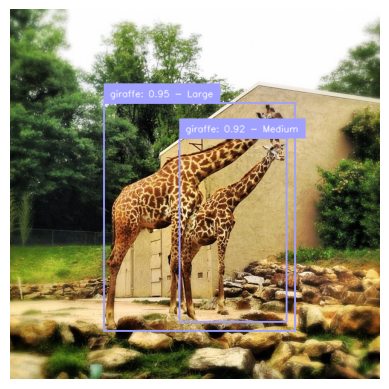


0: 448x640 2 zebras, 16.2ms
Speed: 1.1ms preprocess, 16.2ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


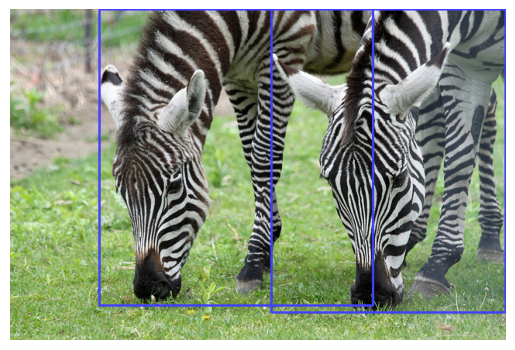


0: 448x640 1 bear, 15.6ms
Speed: 1.1ms preprocess, 15.6ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


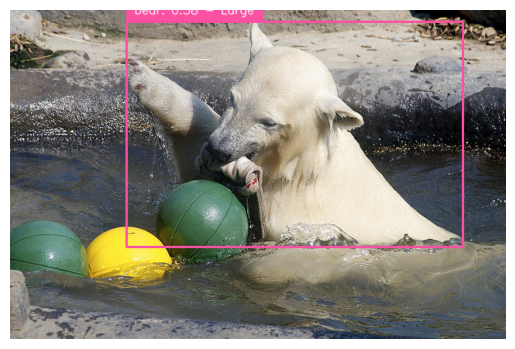

In [13]:
# We could send the images in batches but we're just sending a few and the code is simpler this way
sizes = []
yolo_class_list = list(yolo_classes_to_look_for.values())
min_confidence = .4

for image_path in image_paths:
    img, detections = get_annotated_image_and_metrics(image_path, yolo_class_list, min_confidence)
    sizes.extend(detections.sizes)
    plt.axis('off')
    plt.imshow(img)
    plt.show()

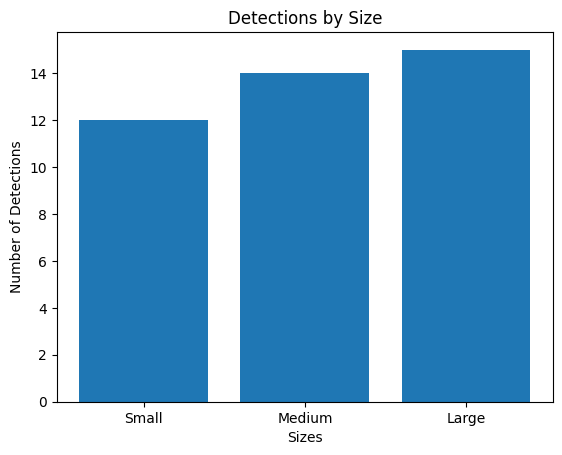

In [14]:
def create_bar_chart(labels, values, x_label, y_label, title):
    """ Create a bar plot with the provided data

    Args:
        labels (list): A list of the labels for each bar
        values (list): A list of the values for each bar
        x_label (string): The x-axis label
        y_label (string): The y-axis label
        title (string): The chart title
    """

    plt.bar(labels, values)
    plt.xlabel(y_label)
    plt.ylabel(x_label)
    plt.title(title)
    plt.show()

size_categories = [size.value for size in Size]
counts = [sizes.count(size) for size in size_categories]
create_bar_chart(size_categories, counts, "Number of Detections", "Sizes", "Detections by Size")